# ⚙️ Notebook - Prétraitement YOLOv8 avec décompression des masques

Cette version corrige la clé utilisée (`objects`), ajoute la décompression `zlib`,
et génère les fichiers `.txt` au format YOLOv8 (segments).

In [ ]:
!pip install ultralytics

In [ ]:
!pip install opencv-python torch torchvision albumentations

In [ ]:
from ultralytics import YOLO
import numpy as np
from PIL import Image
import requests
from io import BytesIO
import cv2
import zipfile
import tarfile
import os
import pandas as pd
import json
import yaml

In [ ]:
# Charger le modèle YOLOv8 pré-entraîné
model = YOLO("yolov8x-seg.pt")

# Entraîner sur notre dataset
model.train(data="/teamspace/studios/this_studio/.lightning_studio/merged_dataset_2/data.yaml", epochs=30, imgsz=640, batch=16, freeze=10)

New https://pypi.org/project/ultralytics/8.3.104 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.100 🚀 Python-3.10.10 torch-2.5.1+cu124 CUDA:0 (NVIDIA A10G, 22724MiB)
engine/trainer: task=segment, mode=train, model=yolov8x-seg.pt, data=/teamspace/studios/this_studio/.lightning_studio/merged_dataset_2/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None

train: Scanning /teamspace/studios/this_studio/.lightning_studio/merged_dataset_2/labels/train... 5086 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5086/5086 [00:09<00:00, 536.29it/s]


train: New cache created: /teamspace/studios/this_studio/.lightning_studio/merged_dataset_2/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /teamspace/studios/this_studio/.lightning_studio/merged_dataset_2/labels/val... 1454 images, 31 backgrounds, 0 corrupt: 100%|██████████| 1485/1485 [00:03<00:00, 465.37it/s]


val: New cache created: /teamspace/studios/this_studio/.lightning_studio/merged_dataset_2/labels/val.cache
Plotting labels to runs/segment/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=8.8e-05, momentum=0.9) with parameter groups 106 weight(decay=0.0), 117 weight(decay=0.0005), 116 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/segment/train3
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/30      7.89G     0.7902       1.91      3.381      1.261        145        640: 100%|██████████| 318/318 [02:33<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.77it/s]


                   all       1485       8020      0.204      0.065     0.0281     0.0258      0.231     0.0246     0.0156    0.00993

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/30      10.9G     0.7085       1.53      2.337      1.187        133        640: 100%|██████████| 318/318 [02:29<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.77it/s]


                   all       1485       8020      0.245     0.0618     0.0334     0.0314      0.243     0.0578     0.0304     0.0167

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/30      10.9G     0.7035      1.485      2.133      1.178        115        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.77it/s]


                   all       1485       8020      0.124     0.0655      0.034     0.0318      0.121     0.0611     0.0304     0.0144

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/30      10.9G     0.6948      1.455      1.998      1.168        137        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.79it/s]


                   all       1485       8020     0.0982     0.0694     0.0336     0.0313     0.0974     0.0675      0.033     0.0171

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/30      10.9G     0.6762      1.395      1.896      1.156        164        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.79it/s]


                   all       1485       8020      0.108     0.0704     0.0345     0.0323      0.108     0.0688     0.0334     0.0209

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/30      10.9G     0.6655      1.363      1.789      1.146        149        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.79it/s]


                   all       1485       8020      0.166     0.0663     0.0379     0.0362      0.165     0.0656     0.0374     0.0229

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/30      10.9G     0.6522      1.336      1.752      1.137        191        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.79it/s]


                   all       1485       8020      0.253     0.0594     0.0491     0.0473      0.251     0.0569     0.0463     0.0293

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/30      10.9G     0.6432        1.3      1.673      1.127        146        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.79it/s]


                   all       1485       8020      0.174     0.0636     0.0404     0.0385      0.172     0.0593     0.0367     0.0207

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/30      10.9G     0.6315      1.276      1.629      1.115        158        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.79it/s]


                   all       1485       8020     0.0908     0.0707     0.0387     0.0371       0.09     0.0693     0.0377     0.0235

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/30      10.9G     0.6298      1.269      1.571      1.114        152        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.79it/s]


                   all       1485       8020     0.0566     0.0641     0.0396     0.0377     0.0558     0.0627     0.0388     0.0256

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/30      10.9G      0.615      1.227      1.531      1.103        159        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.80it/s]


                   all       1485       8020     0.0606     0.0717     0.0432     0.0413     0.0598     0.0706     0.0419     0.0269

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/30      10.9G     0.6071      1.217      1.493      1.096        160        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.79it/s]


                   all       1485       8020      0.167      0.063      0.045     0.0429      0.166     0.0618      0.044     0.0271

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/30      10.9G     0.6009      1.196      1.452      1.088        145        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.80it/s]


                   all       1485       8020     0.0747     0.0713      0.045     0.0434     0.0498     0.0621     0.0394     0.0244

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/30      10.9G     0.5885      1.174      1.412      1.082        169        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.80it/s]


                   all       1485       8020      0.306     0.0579     0.0473     0.0456      0.305     0.0572     0.0463     0.0308

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/30      10.9G     0.5859      1.169      1.387      1.078        141        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.80it/s]


                   all       1485       8020     0.0548     0.0719     0.0489     0.0471     0.0541     0.0706     0.0482     0.0335

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/30      10.9G      0.574      1.142      1.349      1.068        149        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.80it/s]


                   all       1485       8020      0.066     0.0688     0.0443     0.0427     0.0654     0.0678     0.0435     0.0292

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/30      10.9G     0.5725      1.126      1.323      1.068        152        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.81it/s]


                   all       1485       8020     0.0557     0.0698     0.0454     0.0438      0.055     0.0682     0.0444     0.0275

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/30      10.9G     0.5639      1.106      1.291       1.06        147        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:25<00:00,  1.81it/s]


                   all       1485       8020     0.0444      0.076     0.0475     0.0458     0.0435     0.0747     0.0467      0.029

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/30      10.9G     0.5613      1.107      1.262      1.056        189        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.81it/s]


                   all       1485       8020     0.0326     0.0706     0.0474     0.0458     0.0308     0.0678     0.0452     0.0291

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/30      10.9G     0.5511      1.077      1.225       1.05        146        640: 100%|██████████| 318/318 [02:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.81it/s]


                   all       1485       8020     0.0337     0.0701     0.0455      0.044     0.0329      0.069     0.0447     0.0293
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/30      10.9G     0.4858      1.007      1.064      1.036        102        640: 100%|██████████| 318/318 [02:27<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:26<00:00,  1.80it/s]


                   all       1485       8020     0.0478     0.0667     0.0452     0.0437     0.0462     0.0657     0.0443     0.0285

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/30      10.9G     0.4716     0.9735      1.002       1.02         56        640: 100%|██████████| 318/318 [02:27<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:25<00:00,  1.81it/s]


                   all       1485       8020     0.0352     0.0705     0.0465     0.0449     0.0318     0.0642     0.0395     0.0261

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/30      10.9G     0.4631     0.9558     0.9741      1.017         74        640: 100%|██████████| 318/318 [02:27<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:25<00:00,  1.81it/s]


                   all       1485       8020     0.0368     0.0731     0.0456     0.0442     0.0305     0.0614      0.037     0.0258

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/30      10.9G     0.4573     0.9383     0.9208      1.011         80        640: 100%|██████████| 318/318 [02:27<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:25<00:00,  1.81it/s]


                   all       1485       8020     0.0586      0.067     0.0448     0.0435     0.0579     0.0664     0.0442     0.0282

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/30      10.9G     0.4494     0.9247      0.891      1.004         61        640: 100%|██████████| 318/318 [02:27<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:25<00:00,  1.82it/s]


                   all       1485       8020      0.048     0.0666     0.0458     0.0445     0.0471     0.0656     0.0451     0.0299

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/30      10.9G     0.4393      0.898      0.851     0.9936         78        640: 100%|██████████| 318/318 [02:27<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:25<00:00,  1.82it/s]


                   all       1485       8020     0.0373     0.0692     0.0448     0.0434     0.0353     0.0655     0.0418     0.0273

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/30      10.9G     0.4363     0.8975     0.8237     0.9888         62        640: 100%|██████████| 318/318 [02:27<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:25<00:00,  1.81it/s]


                   all       1485       8020     0.0369     0.0756     0.0458     0.0442     0.0319     0.0667     0.0406     0.0269

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/30      10.9G     0.4321     0.8889     0.7982     0.9867         89        640: 100%|██████████| 318/318 [02:27<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:25<00:00,  1.82it/s]


                   all       1485       8020     0.0351     0.0742     0.0455     0.0441     0.0341     0.0726     0.0447     0.0286

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/30      10.9G      0.424      0.877      0.765      0.978         74        640: 100%|██████████| 318/318 [02:27<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:25<00:00,  1.82it/s]


                   all       1485       8020     0.0362     0.0744     0.0434     0.0419     0.0313      0.065     0.0363     0.0252

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/30      10.9G     0.4229     0.8797     0.7591     0.9804         86        640: 100%|██████████| 318/318 [02:27<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:25<00:00,  1.81it/s]


                   all       1485       8020     0.0353     0.0725     0.0459     0.0444     0.0344     0.0711     0.0452     0.0275

30 epochs completed in 1.470 hours.
Optimizer stripped from runs/segment/train3/weights/last.pt, 144.2MB
Optimizer stripped from runs/segment/train3/weights/best.pt, 144.2MB

Validating runs/segment/train3/weights/best.pt...
Ultralytics 8.3.100 🚀 Python-3.10.10 torch-2.5.1+cu124 CUDA:0 (NVIDIA A10G, 22724MiB)
YOLOv8x-seg summary (fused): 125 layers, 71,825,623 parameters, 0 gradients, 344.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/47 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   2%|▏         | 1/47 [00:00<00:29,  1.58it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   4%|▍         | 2/47 [00:01<00:33,  1.36it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:25<00:00,  1.83it/s]


                   all       1485       8020     0.0547     0.0717      0.049     0.0473     0.0541     0.0704     0.0484     0.0336
                  fork         35         35      0.507          1      0.557      0.527      0.478      0.943      0.504      0.334
         class_ass_195         12         12      0.358          1       0.52      0.516      0.358          1       0.52      0.291
         class_ass_215          3          3      0.245          1      0.863      0.863      0.245          1      0.863      0.639
         class_ass_230          8          8      0.328          1      0.742      0.742      0.328          1      0.742      0.511
         class_ass_255          4          4      0.425          1      0.763      0.763      0.425          1      0.763      0.516
         class_ass_270          8          8       0.48      0.625       0.58       0.58       0.48      0.625       0.58      0.417
               chicken          3         14          0          0   

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77,
       78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fc39fbd78e0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.0120

In [ ]:
import os
import cv2
from ultralytics import YOLO

def generate_annotated_images(source_dir, target_dir, model_path):
    # Charger le modèle
    model = YOLO(model_path)

    # Créer le dossier cible s'il n'existe pas
    os.makedirs(target_dir, exist_ok=True)

    # Récupérer les fichiers image du répertoire source
    image_files = [f for f in os.listdir(source_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    for img_file in image_files:
        img_path = os.path.join(source_dir, img_file)
        results = model(img_path, imgsz=640)

        for result in results:
            img_annotated = result.plot()
            output_path = os.path.join(target_dir, img_file)
            cv2.imwrite(output_path, img_annotated)

    print(f"✅ Génération terminée : {len(image_files)} images annotées enregistrées dans {target_dir}")


In [ ]:
generate_annotated_images(
    source_dir="/teamspace/studios/this_studio/calcul/images/test",
    target_dir="/teamspace/studios/this_studio/calcul/images/annotated",
    model_path="/teamspace/studios/this_studio/runs/detect/train/weights/best.pt"
)



image 1/1 /teamspace/studios/this_studio/calcul/images/test/00005625.jpg: 640x640 (no detections), 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /teamspace/studios/this_studio/calcul/images/test/00005759.jpg: 640x640 (no detections), 6.6ms
Speed: 1.6ms preprocess, 6.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /teamspace/studios/this_studio/calcul/images/test/00005640.jpg: 640x640 (no detections), 5.8ms
Speed: 1.2ms preprocess, 5.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /teamspace/studios/this_studio/calcul/images/test/00005645.jpg: 640x640 (no detections), 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /teamspace/studios/this_studio/calcul/images/test/00006068.jpg: 640x640 (no detections), 6.2ms
Speed: 1.2ms preprocess, 6.2ms inference, 0.6ms postprocess per image at shape (1, 3, 

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Charger le modèle YOLOv8
model = YOLO("/teamspace/studios/this_studio/runs/segment/train3/weights/best.pt")

# Charger l'image et faire la prédiction
image_path = "/teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110000.jpg"
results = model(image_path, imgsz=640)  # Taille forcée à 640x640

# Afficher les résultats
for result in results:
    img = result.plot()
    if img is None:
        print("Erreur : aucune image générée par result.plot()")
    else:
        # Convertir en RGB et afficher
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.axis("off")
        plt.show()




image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110000.jpg: 480x640 1 fork, 1 green beans, 1 pasta, 72.5ms
Speed: 2.4ms preprocess, 72.5ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


<Figure size 640x480 with 1 Axes>


image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110000.jpg: 480x640 1 fork, 1 green beans, 1 pasta, 79.8ms
Speed: 8.7ms preprocess, 79.8ms inference, 590.6ms postprocess per image at shape (1, 3, 480, 640)


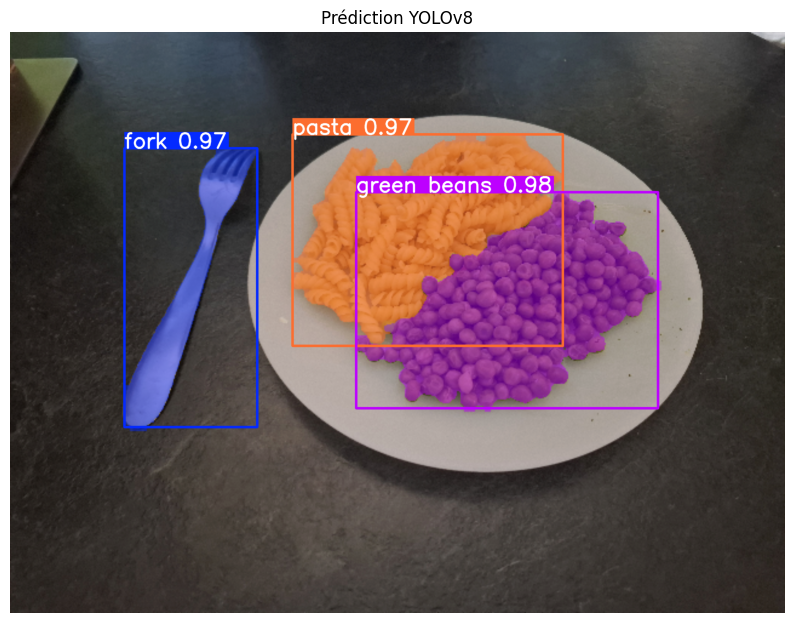

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# === Chargement du modèle ===
model_path = "/teamspace/studios/this_studio/runs/segment/train3/weights/best.pt"
model = YOLO(model_path)

# === Chargement de l'image et prédiction ===
image_path = "/teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110000.jpg"
results = model(image_path, imgsz=640)  # Taille d'entrée du modèle

# === Affichage des résultats ===
for result in results:
    # Génère une image annotée avec les prédictions
    img = result.plot()

    if img is None:
        print("❌ Aucune image générée par result.plot()")
    else:
        # Conversion BGR -> RGB pour affichage avec Matplotlib
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Affichage
        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.axis("off")
        plt.title("Prédiction YOLOv8")
        plt.show()



image 1/1 /teamspace/studios/this_studio/.lightning_studio/merged_dataset_2/images/test/ass_195_00000002_resized.jpg: 640x640 1 fork, 1 class_ass_195, 23.7ms
Speed: 1.1ms preprocess, 23.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


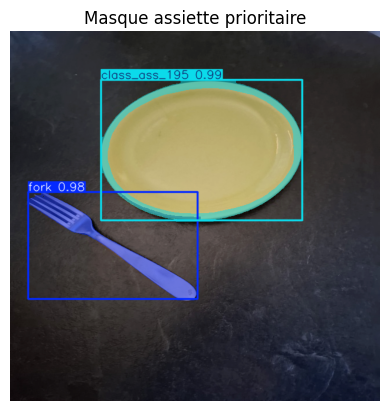

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Charger le modèle
model = YOLO("/teamspace/studios/this_studio/runs/segment/train3/weights/best.pt")

# Charger l'image
image_path = "/teamspace/studios/this_studio/.lightning_studio/merged_dataset_2/images/test/ass_195_00000002_resized.jpg"
results = model(image_path, imgsz=640)

# Affichage avec priorité à l’assiette
for result in results:
    boxes = result.boxes
    masks = result.masks
    class_ids = boxes.cls.int().tolist()
    class_names = result.names

    if masks is not None:
        indexed_classes = [(i, class_names[class_ids[i]]) for i in range(len(class_ids))]

        # 🔁 Changer ici selon le nom exact de ta classe pour l’assiette
        sorted_indices = sorted(indexed_classes, key=lambda x: 0 if x[1] in ["plate", "assiette"] else 1)

        # Réordonner les boxes et les masks (utilise .data ici)
        result.boxes.data = boxes.data[[i for i, _ in sorted_indices]]
        result.masks.data = masks.data[[i for i, _ in sorted_indices]]

    # Génération et affichage
    img = result.plot()
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis("off")
    plt.title("Masque assiette prioritaire")
    plt.show()


methode 2 models separés

In [ ]:
from ultralytics import YOLO
import torch
from PIL import Image
from ultralytics.engine.results import Boxes
import pandas as pd
import matplotlib.pyplot as plt
import cv2

def predict_and_dataframe(image_path, glucy_model_path, plate_model_path, show=False):
    """
    Prédit les objets avec fallback assiette. Affiche image originale + prédiction.
    Retourne un DataFrame avec label, confiance et aire (pixels) au lieu de bbox.

    Args:
        image_path (str): Chemin image.
        glucy_model_path (str): Modèle multi-aliments.
        plate_model_path (str): Modèle assiette-only (fallback).
        show (bool): Affichage visuel.

    Returns:
        result (Results): prédiction YOLO complète
        df (pd.DataFrame): tableau des détections avec aire en pixels
    """
    model_main = YOLO(glucy_model_path)
    model_plate = YOLO(plate_model_path)

    # Prédiction principale
    main_result = model_main(image_path, imgsz=640)[0]

    # Vérifier si une assiette est détectée
    plate_detected = False
    if main_result.names and main_result.boxes.cls is not None:
        class_names = [main_result.names[int(c)] for c in main_result.boxes.cls]
        plate_detected = any("class_ass" in name.lower() or "plate" in name.lower() for name in class_names)

    # Fallback si aucune assiette détectée
    if not plate_detected:
        plate_result = model_plate(image_path, imgsz=640)[0]

        if plate_result.boxes and plate_result.boxes.cls.numel() > 0:
            class_ids = plate_result.boxes.cls.cpu().numpy().astype(int)
            labels = [plate_result.names[i] for i in class_ids]

            # Garder uniquement les prédictions "class_ass*"
            valid_indices = [i for i, label in enumerate(labels) if "class_ass" in label.lower()]

            if valid_indices:
                # Prédiction avec la plus haute confiance
                confs = plate_result.boxes.conf[valid_indices]
                best_rel_idx = torch.argmax(confs)
                best_idx = valid_indices[int(best_rel_idx)]

                # Filtrer la boîte
                plate_result.boxes = Boxes(plate_result.boxes.data[best_idx].unsqueeze(0), plate_result.orig_shape)

                # Filtrer le masque correspondant
                if plate_result.masks is not None:
                    plate_result.masks.data = plate_result.masks.data[best_idx].unsqueeze(0)

                # Fusion des masques
                if main_result.masks is not None and plate_result.masks is not None:
                    main_result.masks.data = torch.cat([main_result.masks.data, plate_result.masks.data])
                elif plate_result.masks is not None:
                    main_result.masks = plate_result.masks

                # Fusion des boîtes
                all_boxes_data = torch.cat([main_result.boxes.data, plate_result.boxes.data])
                main_result.boxes = Boxes(all_boxes_data, main_result.orig_shape)

    # Création du DataFrame (aire au lieu de bbox)
    if main_result.boxes is None or main_result.boxes.cls.numel() == 0:
        df = pd.DataFrame(columns=["label", "confidence", "area_pixels"])
    else:
        class_ids = main_result.boxes.cls.cpu().numpy().astype(int)
        confs = main_result.boxes.conf.cpu().numpy()
        labels = [main_result.names[i] for i in class_ids]

        # Calcul des aires
        if main_result.masks is not None:
            masks = main_result.masks.data.cpu().numpy()  # (N, H, W)
            areas = [int(mask.sum()) for mask in masks]
        else:
            areas = [None] * len(class_ids)

        df = pd.DataFrame({
            "label": labels,
            "confidence": confs,
            "area_pixels": areas
        })

    # Affichage visuel
    if show:
        original = cv2.imread(image_path)
        original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
        predicted = main_result.plot()
        predicted = cv2.cvtColor(predicted, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(original)
        plt.title("Image originale")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(predicted)
        plt.title("Prédiction YOLO")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

    return main_result, df


In [ ]:
from ultralytics import YOLO
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from ultralytics.engine.results import Boxes

def predict_separate_and_display(image_path, glucy_model_path, plate_model_path, show=True):
    """
    Prédit une image avec deux modèles YOLO séparés (assiette et nourriture).
    Affiche l'image originale + la prédiction assiette (avec masque accentué) + la prédiction nourriture.
    Retourne les résultats YOLO complets et deux DataFrames (assiette et nourriture).

    Args:
        image_path (str): Chemin vers l'image à prédire.
        glucy_model_path (str): Chemin vers le modèle YOLO segmentant les aliments.
        plate_model_path (str): Chemin vers le modèle YOLO détectant uniquement les assiettes.
        show (bool): Affiche les résultats visuellement si True.

    Returns:
        plate_result (Results): Résultat YOLO du modèle assiette.
        plate_df (pd.DataFrame): Résumé des détections du modèle assiette.
        food_result (Results): Résultat YOLO du modèle nourriture.
        food_df (pd.DataFrame): Résumé des détections du modèle nourriture.
    """

    # Chargement des modèles
    model_plate = YOLO(plate_model_path)
    model_food = YOLO(glucy_model_path)

    # Prédictions séparées
    plate_result = model_plate(image_path, imgsz=640)[0]
    food_result = model_food(image_path, imgsz=640)[0]

    def result_to_df(result):
        if result.boxes is None or result.boxes.cls.numel() == 0:
            return pd.DataFrame(columns=["label", "confidence", "area_pixels"])
        class_ids = result.boxes.cls.cpu().numpy().astype(int)
        confs = result.boxes.conf.cpu().numpy()
        labels = [result.names[i] for i in class_ids]
        if result.masks is not None:
            masks = result.masks.data.cpu().numpy()
            areas = [int(mask.sum()) for mask in masks]
        else:
            areas = [None] * len(class_ids)
        return pd.DataFrame({
            "label": labels,
            "confidence": confs,
            "area_pixels": areas
        })

    # DataFrames
    plate_df = result_to_df(plate_result)
    food_df = result_to_df(food_result)

    # Affichage visuel
    if show:
        original = cv2.imread(image_path)
        original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
        original_copy = original_rgb.copy()

        # Accentuation du masque de l’assiette
        if plate_result.masks is not None:
            masks = plate_result.masks.data.cpu().numpy()
            class_ids = plate_result.boxes.cls.cpu().numpy().astype(int)
            labels = [plate_result.names[i] for i in class_ids]

            H, W, _ = original_copy.shape

            for mask, label in zip(masks, labels):
                if "class_ass" in label.lower() or "plate" in label.lower():
                    color = np.array([255, 0, 0], dtype=np.uint8)  # Rouge
                    alpha = 0.5
                    mask_resized = cv2.resize(mask.astype(np.uint8), (W, H), interpolation=cv2.INTER_NEAREST)
                    mask_bool = mask_resized.astype(bool)
                    original_copy[mask_bool] = (
                        alpha * color + (1 - alpha) * original_copy[mask_bool]
                    ).astype(np.uint8)

        # Affichage YOLO pour la nourriture
        food_img = food_result.plot()
        food_img = cv2.cvtColor(food_img, cv2.COLOR_BGR2RGB)

        # Affichage combiné
        plt.figure(figsize=(18, 6))
        plt.subplot(1, 3, 1)
        plt.imshow(original_rgb)
        plt.title("Image originale")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(original_copy)
        plt.title("Masque assiette accentué")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(food_img)
        plt.title("Modèle nourriture")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

    return plate_result, plate_df, food_result, food_df



image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110030.jpg: 480x640 1 fork, 1 class_ass_195, 1 class_ass_270, 489.7ms
Speed: 2.4ms preprocess, 489.7ms inference, 4.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110030.jpg: 480x640 1 fork, 1 rice, 1 potato, 1436.4ms
Speed: 3.0ms preprocess, 1436.4ms inference, 4.3ms postprocess per image at shape (1, 3, 480, 640)


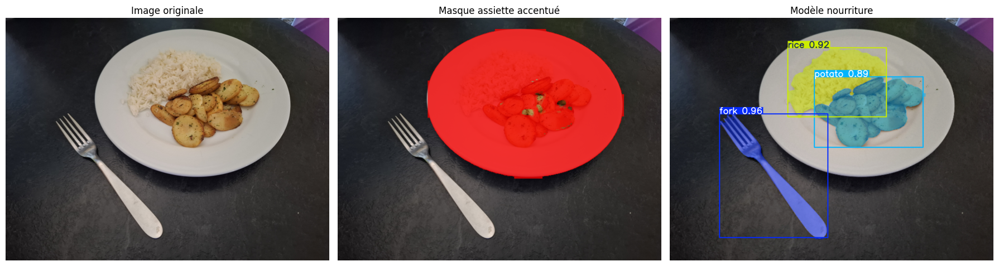

Assiette détectée :
           label  confidence  area_pixels
0           fork    0.962449         8452
1  class_ass_270    0.839666        88788
2  class_ass_195    0.264937        89309

Nourriture détectée :
    label  confidence  area_pixels
0    fork    0.962614         8728
1    rice    0.923499        14280
2  potato    0.888694        17728


In [ ]:
plate_result, plate_df, food_result, food_df = predict_separate_and_display(
    image_path="/teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110030.jpg",
    glucy_model_path="/teamspace/studios/this_studio/runs/segment/train2/weights/best.pt",
    plate_model_path="/teamspace/studios/this_studio/runs/segment/yolo_plate_only_v8m8/weights/best.pt",
    show=True
)

print("Assiette détectée :")
print(plate_df)

print("\nNourriture détectée :")
print(food_df)



image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110030.jpg: 480x640 1 fork, 1 rice, 1 potato, 19.5ms
Speed: 2.1ms preprocess, 19.5ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110030.jpg: 480x640 1 fork, 1 class_ass_195, 1 class_ass_270, 9.5ms
Speed: 2.2ms preprocess, 9.5ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


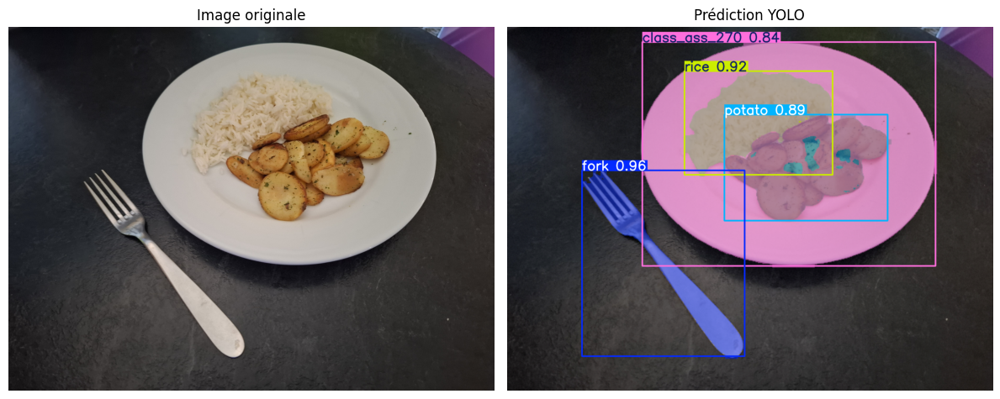

,label,confidence,area_pixels
0,fork,0.962617,8728
1,rice,0.923487,14280
2,potato,0.888785,17728
3,class_ass_270,0.839714,88787


In [ ]:
result, df = predict_and_dataframe(
    image_path="/teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110030.jpg",
    glucy_model_path="/teamspace/studios/this_studio/runs/segment/train2/weights/best.pt",
    plate_model_path="/teamspace/studios/this_studio/runs/segment/yolo_plate_only_v8m8/weights/best.pt",
    show=True
)

df



image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_105537.jpg: 480x640 2 forks, 1 class_ass_195, 500.8ms
Speed: 2.5ms preprocess, 500.8ms inference, 4.1ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_105537.jpg: 480x640 1 fork, 1 green beans, 1925.3ms
Speed: 2.9ms preprocess, 1925.3ms inference, 5.6ms postprocess per image at shape (1, 3, 480, 640)


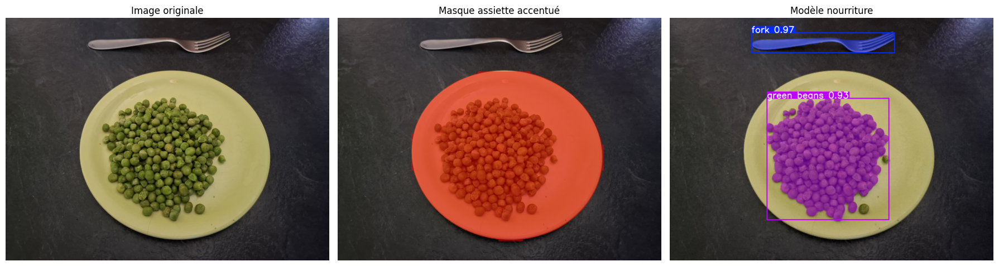

Assiette détectée :
           label  confidence  area_pixels
0  class_ass_195    0.991626       100208
1           fork    0.931325         4591
2           fork    0.894300         4783

Nourriture détectée :
         label  confidence  area_pixels
0         fork    0.973738         4773
1  green beans    0.929666        39920


In [ ]:
plate_result, plate_df, food_result, food_df = predict_separate_and_display(
    image_path="/teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_105537.jpg",
    glucy_model_path="/teamspace/studios/this_studio/runs/segment/train2/weights/best.pt",
    plate_model_path="/teamspace/studios/this_studio/runs/segment/yolo_plate_only_v8m8/weights/best.pt",
    show=True
)

print("Assiette détectée :")
print(plate_df)

print("\nNourriture détectée :")
print(food_df)



image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_105537.jpg: 480x640 1 fork, 1 green beans, 19.5ms
Speed: 2.2ms preprocess, 19.5ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_105537.jpg: 480x640 2 forks, 1 class_ass_195, 9.3ms
Speed: 2.2ms preprocess, 9.3ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


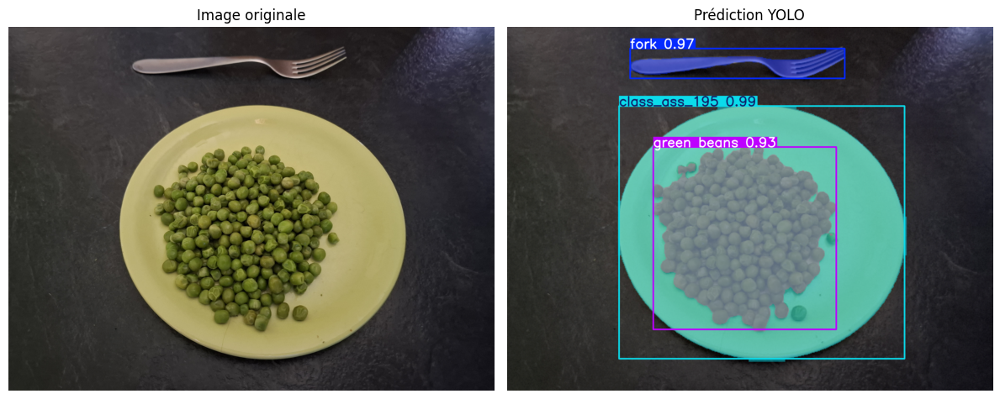

,label,confidence,area_pixels
0,fork,0.973707,4774
1,green beans,0.929574,39920
2,class_ass_195,0.991626,100208


In [ ]:
result, df = predict_and_dataframe(
    image_path="/teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_105537.jpg",
    glucy_model_path="/teamspace/studios/this_studio/runs/segment/train2/weights/best.pt",
    plate_model_path="/teamspace/studios/this_studio/runs/segment/yolo_plate_only_v8m8/weights/best.pt",
    show=True
)

df



image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_105331.jpg: 640x480 1 fork, 1 class_ass_195, 565.8ms
Speed: 2.6ms preprocess, 565.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_105331.jpg: 640x480 1 fork, 1 rice, 1820.1ms
Speed: 18.4ms preprocess, 1820.1ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 480)


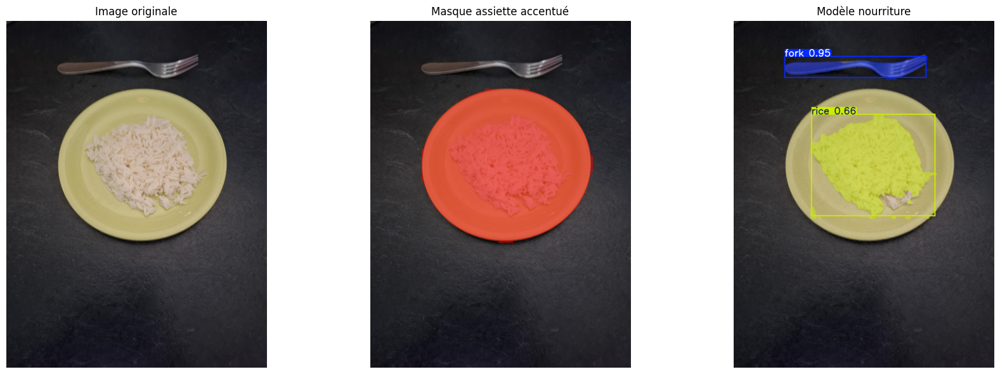

Assiette détectée :
           label  confidence  area_pixels
0  class_ass_195    0.986657        69567
1           fork    0.910417         5069

Nourriture détectée :
  label  confidence  area_pixels
0  fork    0.948799         5179
1  rice    0.657304        25278


In [ ]:
plate_result, plate_df, food_result, food_df = predict_separate_and_display(
    image_path="/teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_105331.jpg",
    glucy_model_path="/teamspace/studios/this_studio/runs/segment/train2/weights/best.pt",
    plate_model_path="/teamspace/studios/this_studio/runs/segment/yolo_plate_only_v8m8/weights/best.pt",
    show=True
)

print("Assiette détectée :")
print(plate_df)

print("\nNourriture détectée :")
print(food_df)



image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_105331.jpg: 640x480 1 fork, 1 rice, 19.1ms
Speed: 2.9ms preprocess, 19.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_105331.jpg: 640x480 1 fork, 1 class_ass_195, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


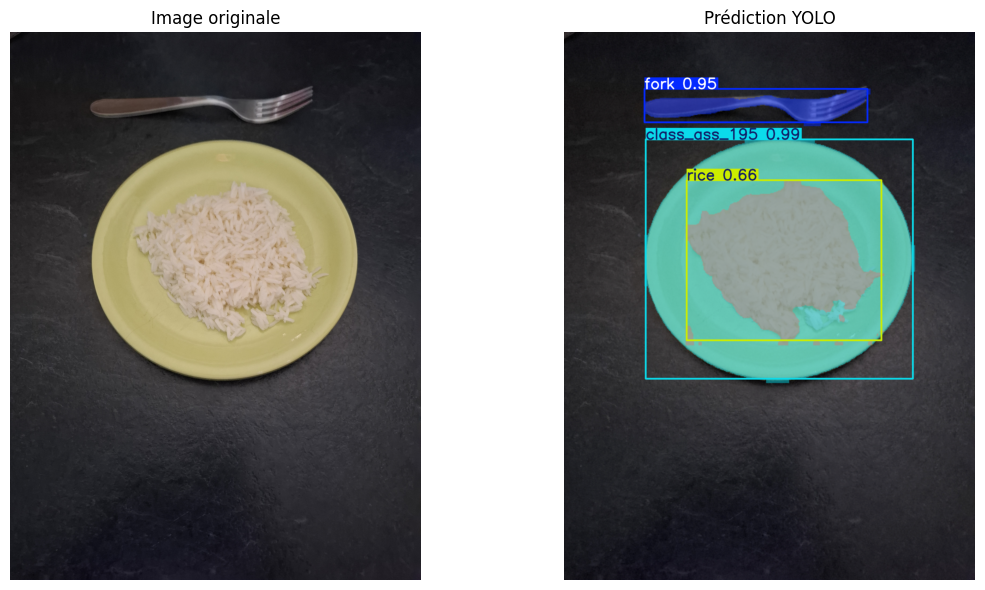

,label,confidence,area_pixels
0,fork,0.948742,5179
1,rice,0.657603,25277
2,class_ass_195,0.986652,69567


In [ ]:
result, df = predict_and_dataframe(
    image_path="/teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_105331.jpg",
    glucy_model_path="/teamspace/studios/this_studio/runs/segment/train2/weights/best.pt",
    plate_model_path="/teamspace/studios/this_studio/runs/segment/yolo_plate_only_v8m8/weights/best.pt",
    show=True
)

df



image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110002.jpg: 480x640 1 fork, 1 class_ass_195, 1 class_ass_270, 452.4ms
Speed: 2.4ms preprocess, 452.4ms inference, 5.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110002.jpg: 480x640 1 fork, 1 rice, 1 green beans, 1 pasta, 1277.9ms
Speed: 2.7ms preprocess, 1277.9ms inference, 5.4ms postprocess per image at shape (1, 3, 480, 640)


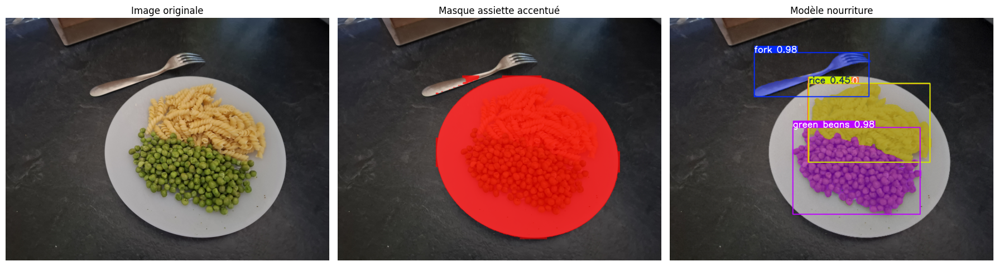

Assiette détectée :
           label  confidence  area_pixels
0           fork    0.969916         1855
1  class_ass_270    0.809327        91543
2  class_ass_195    0.627529        91706

Nourriture détectée :
         label  confidence  area_pixels
0  green beans    0.984119        25153
1         fork    0.976788         3961
2         rice    0.446409        21787
3        pasta    0.404543        21765


In [ ]:
plate_result, plate_df, food_result, food_df = predict_separate_and_display(
    image_path="/teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110002.jpg",
    glucy_model_path="/teamspace/studios/this_studio/runs/segment/train2/weights/best.pt",
    plate_model_path="/teamspace/studios/this_studio/runs/segment/yolo_plate_only_v8m8/weights/best.pt",
    show=True
)

print("Assiette détectée :")
print(plate_df)

print("\nNourriture détectée :")
print(food_df)



image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110002.jpg: 480x640 1 fork, 1 rice, 1 green beans, 1 pasta, 19.9ms
Speed: 2.2ms preprocess, 19.9ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110002.jpg: 480x640 1 fork, 1 class_ass_195, 1 class_ass_270, 9.6ms
Speed: 2.2ms preprocess, 9.6ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


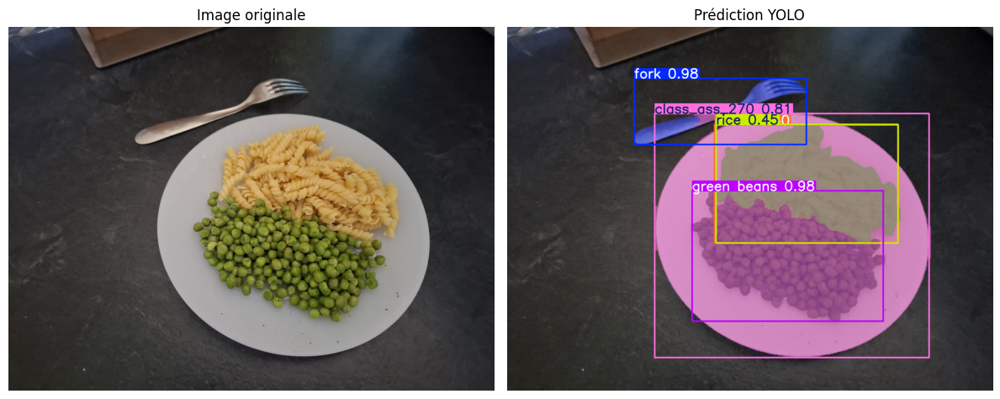

,label,confidence,area_pixels
0,green beans,0.984117,25152
1,fork,0.976783,3961
2,rice,0.446789,21786
3,pasta,0.404528,21764
4,class_ass_270,0.809526,91543


In [ ]:
result, df = predict_and_dataframe(
    image_path="/teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/20250406_110002.jpg",
    glucy_model_path="/teamspace/studios/this_studio/runs/segment/train2/weights/best.pt",
    plate_model_path="/teamspace/studios/this_studio/runs/segment/yolo_plate_only_v8m8/weights/best.pt",
    show=True
)

df



image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/clem01.jpg: 480x640 1 class_ass_270, 480.7ms
Speed: 2.5ms preprocess, 480.7ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/clem01.jpg: 480x640 1 broccoli, 1 cauliflower, 1280.2ms
Speed: 2.5ms preprocess, 1280.2ms inference, 3.7ms postprocess per image at shape (1, 3, 480, 640)


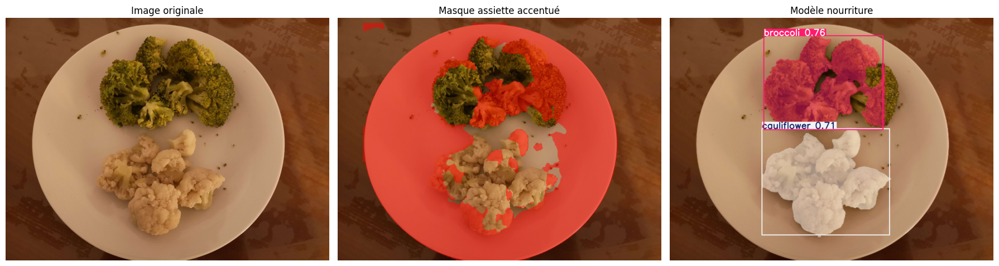

Assiette détectée :
           label  confidence  area_pixels
0  class_ass_270    0.639946       138748

Nourriture détectée :
         label  confidence  area_pixels
0     broccoli    0.763551        30535
1  cauliflower    0.710943        30433


In [ ]:
plate_result, plate_df, food_result, food_df = predict_separate_and_display(
    image_path="/teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/clem01.jpg",
    glucy_model_path="/teamspace/studios/this_studio/runs/segment/train2/weights/best.pt",
    plate_model_path="/teamspace/studios/this_studio/runs/segment/yolo_plate_only_v8m8/weights/best.pt",
    show=True
)

print("Assiette détectée :")
print(plate_df)

print("\nNourriture détectée :")
print(food_df)



image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/clem01.jpg: 480x640 1 broccoli, 1 cauliflower, 80.5ms
Speed: 9.3ms preprocess, 80.5ms inference, 554.1ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/clem01.jpg: 480x640 1 class_ass_270, 75.3ms
Speed: 2.3ms preprocess, 75.3ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)


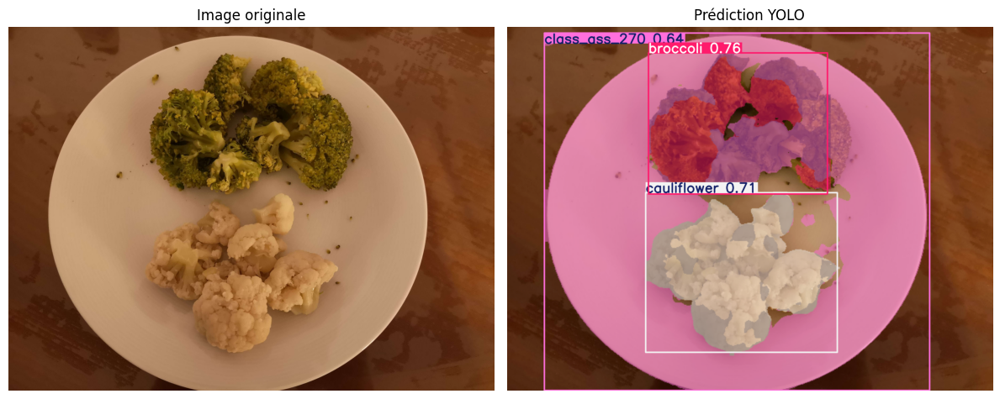

,label,confidence,area_pixels
0,broccoli,0.763317,30545
1,cauliflower,0.710431,30433
2,class_ass_270,0.640279,138776


In [ ]:
result, df = predict_and_dataframe(
    image_path="/teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/clem01.jpg",
    glucy_model_path="/teamspace/studios/this_studio/runs/segment/train2/weights/best.pt",
    plate_model_path="/teamspace/studios/this_studio/runs/segment/yolo_plate_only_v8m8/weights/best.pt",
    show=True
)

df



image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/clem02.jpg: 480x640 1 fork, 1 class_ass_270, 452.4ms
Speed: 2.5ms preprocess, 452.4ms inference, 3.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/clem02.jpg: 480x640 1 fork, 1 broccoli, 1 cauliflower, 1285.9ms
Speed: 2.6ms preprocess, 1285.9ms inference, 4.2ms postprocess per image at shape (1, 3, 480, 640)


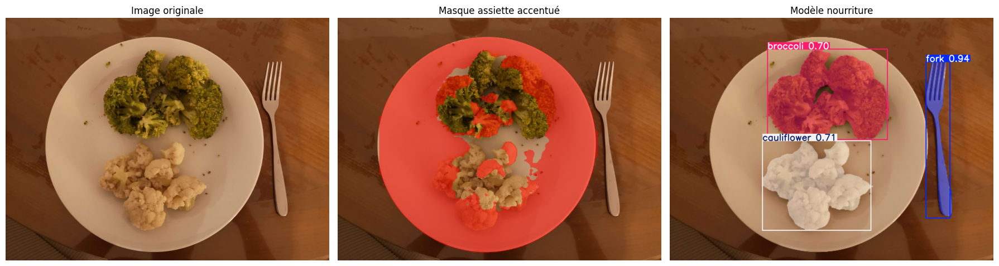

Assiette détectée :
           label  confidence  area_pixels
0           fork    0.942008         6795
1  class_ass_270    0.675233       108293

Nourriture détectée :
         label  confidence  area_pixels
0         fork    0.940561         6609
1  cauliflower    0.709513        22227
2     broccoli    0.704562        30049


In [ ]:
plate_result, plate_df, food_result, food_df = predict_separate_and_display(
    image_path="/teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/clem02.jpg",
    glucy_model_path="/teamspace/studios/this_studio/runs/segment/train2/weights/best.pt",
    plate_model_path="/teamspace/studios/this_studio/runs/segment/yolo_plate_only_v8m8/weights/best.pt",
    show=True
)

print("Assiette détectée :")
print(plate_df)

print("\nNourriture détectée :")
print(food_df)



image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/clem02.jpg: 480x640 1 fork, 1 broccoli, 1 cauliflower, 19.6ms
Speed: 2.5ms preprocess, 19.6ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/clem02.jpg: 480x640 1 fork, 1 class_ass_270, 9.4ms
Speed: 2.2ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


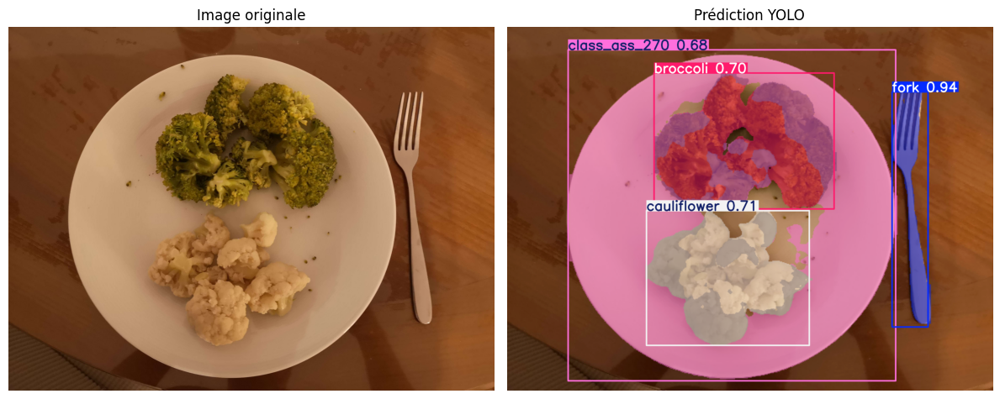

,label,confidence,area_pixels
0,fork,0.940538,6610
1,cauliflower,0.709821,22227
2,broccoli,0.704634,30049
3,class_ass_270,0.675324,108307


In [ ]:
result, df = predict_and_dataframe(
    image_path="/teamspace/studios/this_studio/.lightning_studio/dataset_etalonné/clem02.jpg",
    glucy_model_path="/teamspace/studios/this_studio/runs/segment/train2/weights/best.pt",
    plate_model_path="/teamspace/studios/this_studio/runs/segment/yolo_plate_only_v8m8/weights/best.pt",
    show=True
)

df
